In [1]:
import torch
print(torch.backends.mps.is_available())

True


In [2]:
import os
import datetime
import numpy as np
# import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from PIL import Image
from IPython.display import display
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.optim.lr_scheduler import StepLR
from torchsummary import summary
from tqdm import tqdm
import torchvision.models as models
import PIL
from torchvision.models import resnet50, ResNet50_Weights
# import timm
from torch.utils.data import Dataset
import glob
import random
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
from math import log2
import torchvision

In [3]:
data_path = 'celeba_hq/train'

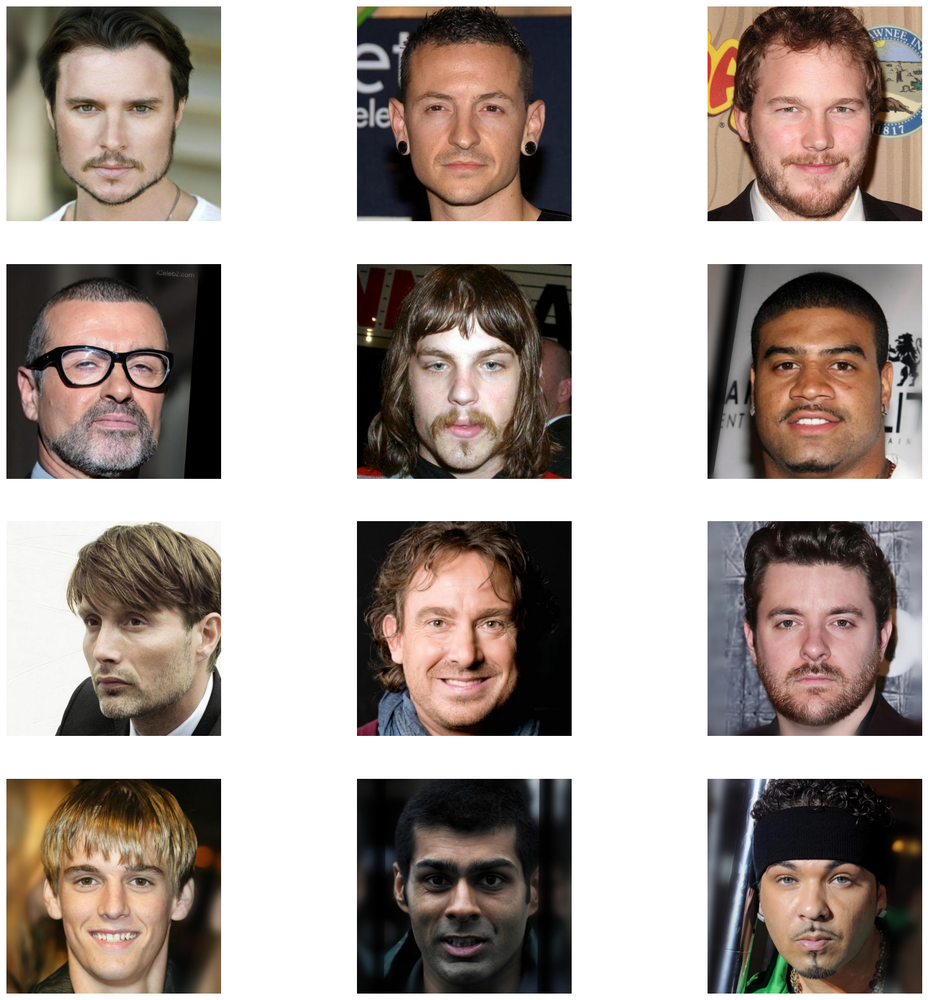

In [4]:
# Males
plt.figure(figsize=(20, 20))
for i, file in enumerate(os.listdir(data_path + "/male")[0:12]):
    fullpath = data_path + "/male/" + file
    img=mpimg.imread(fullpath)
    ax=plt.subplot(4,3,i+1)
    plt.axis('off')
    plt.imshow(img)

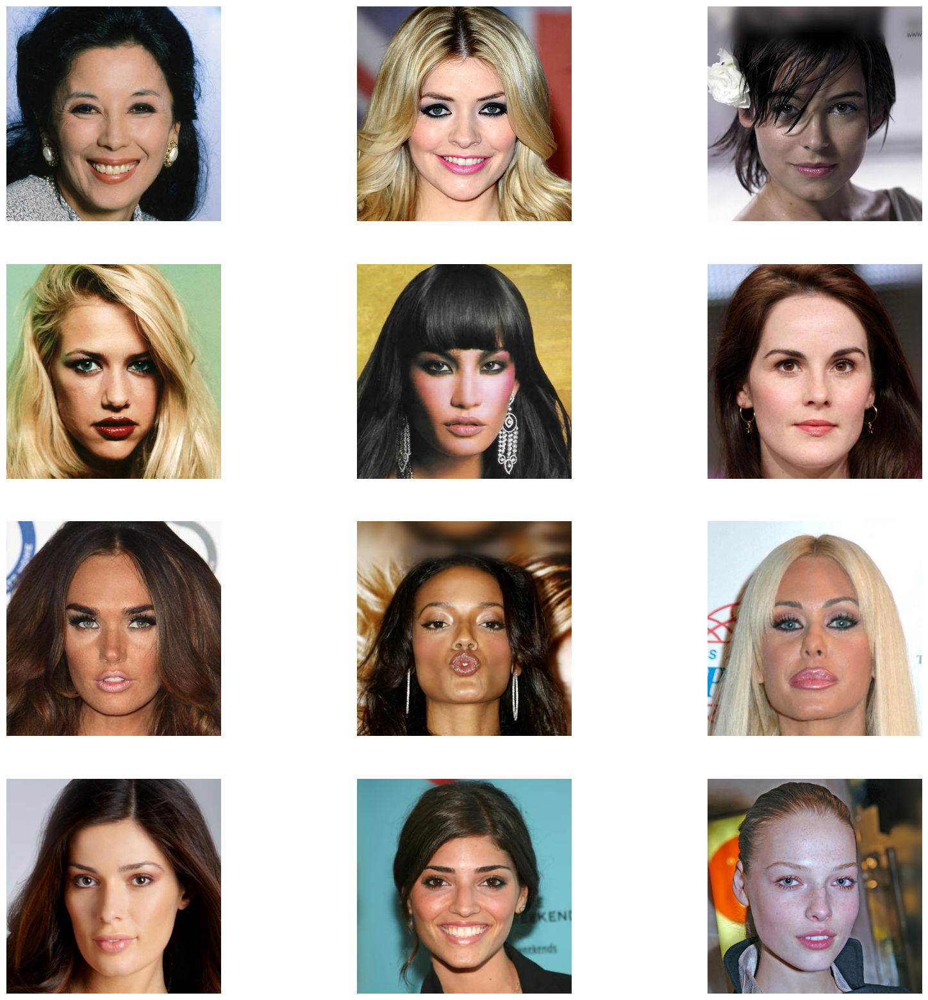

In [5]:
# Females
plt.figure(figsize=(20, 20))
for i, file in enumerate(os.listdir(data_path + "/female")[0:12]):
    fullpath = data_path + "/female/" + file
    img=mpimg.imread(fullpath)
    ax=plt.subplot(4,3,i+1)
    plt.axis('off')
    plt.imshow(img)

In [6]:
def check_all_file_size(sub_folder):
    count = 0
    for file in os.listdir(data_path + "/" + sub_folder):
        file_path =  os.path.join(data_path, sub_folder, file)
        shape = mpimg.imread(file_path).shape
        count = count + 1
        if shape != (1024,1024,3):
            print(f'%s has different format: %s', file_path, shape)

In [7]:
#check_all_file_size('male')

In [8]:
#check_all_file_size('female')

# Weighted Convolution

In [9]:
class WSConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1, gain=2):
        super(WSConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (gain / (in_channels * kernel_size ** 2)) ** 0.5
        self.bias = self.conv.bias
        self.conv.bias = None

        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.conv(x) * self.scale + self.bias.view(1, self.bias.shape[0],1,1)              

# Wighted Transpose Convolution

In [10]:
class WSConvTranspose2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=1, padding=0, gain=2):
        super(WSConvTranspose2d, self).__init__()
        self.conv_transpose = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (gain / (in_channels * kernel_size ** 2)) ** 0.5
        self.bias = self.conv_transpose.bias
        self.conv_transpose.bias = None

        nn.init.normal_(self.conv_transpose.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.conv_transpose(x) * self.scale + self.bias.view(1, self.bias.shape[0],1,1)   

# Pixel Norm

In [11]:
class PixelNorm(nn.Module):
    def __init__(self):
        super(PixelNorm,self).__init__()
    
    def forward(self,x):
        return x/torch.sqrt(torch.mean(x**2, dim=1, keepdim=True) + 1e-8)

# Generator

In [12]:
class Generator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Generator,self).__init__()
        self.in_channels = in_channels
        self.img_channels = img_channels
        self.z_dim = z_dim
        # 512*1*1 -> 512*4*4
        self.initial = nn.Sequential(
            WSConvTranspose2d(z_dim, in_channels, kernel_size=4, stride=1, padding=0),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
            PixelNorm(),
        )
        
        # 512*4*4 -> 3*4*4
        self.initial_rgb = WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)
        self.leaky = nn.LeakyReLU(0.2)
        self.pn = PixelNorm()

        scale = [1, 1, 1, 1, 1 / 2, 1 / 4, 1 / 8, 1 / 16, 1 / 32]
        self.moduless = nn.ModuleList([self.initial])
        self.to_rgb = nn.ModuleList([self.initial_rgb])
        for i in range(len(scale)-1):
            if int(in_channels*scale[i]) != 0 and int(in_channels*scale[i+1]) != 0:
                self.moduless.append( WSConv2d(int(in_channels*scale[i]), int(in_channels*scale[i+1])))
                self.moduless.append( WSConv2d(int(in_channels*scale[i+1]), int(in_channels*scale[i+1])))
    
                self.to_rgb.append(WSConv2d(int(in_channels*scale[i]), img_channels, kernel_size=1, stride=1, padding=0))
                self.to_rgb.append(WSConv2d(int(in_channels*scale[i+1]), img_channels, kernel_size=1, stride=1, padding=0))
        
        """self.moduless = nn.ModuleList([self.initial,
                                       WSConv2d(in_channels, in_channels), WSConv2d(in_channels, in_channels),
                                       WSConv2d(in_channels, in_channels), WSConv2d(in_channels, in_channels),
                                       WSConv2d(in_channels, in_channels), WSConv2d(in_channels, in_channels),
                                       WSConv2d(in_channels, int(in_channels/2)), WSConv2d(int(in_channels/2), int(in_channels/2)),
                                       WSConv2d(int(in_channels/2), int(in_channels/4)), WSConv2d(int(in_channels/4), int(in_channels/4)),
                                       WSConv2d(int(in_channels/4), int(in_channels/8)), WSConv2d(int(in_channels/8), int(in_channels/8)),
                                       WSConv2d(int(in_channels/8), int(in_channels/16)), WSConv2d(int(in_channels/16), int(in_channels/16)),
                                       WSConv2d(int(in_channels/16), int(in_channels/32)), WSConv2d(int(in_channels/32), int(in_channels/32)),
                                       WSConv2d(int(in_channels/32), img_channels, kernel_size=1, stride=1, padding=0)
                                      ])"""
        """self.to_rgb = nn.ModuleList([self.initial_rgb, self.initial_rgb, 
                                     self.initial_rgb, self.initial_rgb, 
                                     self.initial_rgb, self.initial_rgb, 
                                     self.initial_rgb, 
                                     WSConv2d(int(in_channels/2), img_channels, kernel_size=1, stride=1, padding=0), WSConv2d(int(in_channels/2), img_channels, kernel_size=1, stride=1, padding=0),
                                     WSConv2d(int(in_channels/4), img_channels, kernel_size=1, stride=1, padding=0), WSConv2d(int(in_channels/4), img_channels, kernel_size=1, stride=1, padding=0),
                                     WSConv2d(int(in_channels/8), img_channels, kernel_size=1, stride=1, padding=0), WSConv2d(int(in_channels/8), img_channels, kernel_size=1, stride=1, padding=0),
                                     WSConv2d(int(in_channels/16), img_channels, kernel_size=1, stride=1, padding=0), WSConv2d(int(in_channels/16), img_channels, kernel_size=1, stride=1, padding=0),
                                     WSConv2d(int(in_channels/32), img_channels, kernel_size=1, stride=1, padding=0)
                                    ]
                                   )"""

    def fade_in(self, alpha, upscaled, generated):
        # alpha should be scalar within [0, 1], and upscale.shape == generated.shape
        return torch.tanh(alpha * generated + (1 - alpha) * upscaled)
        
    def upscaled_image(self,x):
        return F.interpolate(x, scale_factor=2, mode="nearest")
    
    def forward(self, x, alpha, steps):
        in_channels = self.in_channels
        img_channels = self.img_channels
        if steps == 0:
            x = self.moduless[0](x)
            return self.to_rgb[0](x)
            
        # Block 1
        # x => 512*1*1
        x = self.moduless[0](x) # 512*4*4

        up = self.upscaled_image(x) # 512*8*8
        out = self.leaky(self.moduless[1](up)) # 512*8*8
        out = self.pn(out)
        out = self.leaky(self.moduless[2](out)) # 512*8*8
        out = self.pn(out)        
        
        if steps == 1:
            # to RGB
            up_rgb = self.to_rgb[1](up) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(up) # 3*8*8
            # to RGB
            out_rgb = self.to_rgb[2](out) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(out) # 3*8*8
            x = self.fade_in(alpha, up_rgb, out_rgb)
            return x
        
        # Block 2
        up = self.upscaled_image(out) # 512*16*16
        out = self.leaky(self.moduless[3](up)) # 512*16*16
        out = self.pn(out)
        out = self.leaky(self.moduless[4](out)) # 512*16*16
        out = self.pn(out)

        if steps == 2:
            # to RGB
            up_rgb = self.to_rgb[3](up) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(up) # 3*16*16
            # to RGB
            out_rgb = self.to_rgb[4](out) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(out) # 3*16*16
            x = self.fade_in(alpha, up_rgb, out_rgb)
            return x
        
        # Block 3
        up = self.upscaled_image(out) # 512*32*32
        out = self.leaky(self.moduless[5](up)) # 512*32*32
        out = self.pn(out)
        out = self.leaky(self.moduless[6](out)) # 512*32*32
        out = self.pn(out)
        
        if steps == 3:
            # to RGB
            up_rgb = self.to_rgb[5](up) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(up) # 3*32*32
            # to RGB
            out_rgb = self.to_rgb[6](out) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(out) # 3*32*32
            x = self.fade_in(alpha, up_rgb, out_rgb)
            return x
        
        # Block 4
        up = self.upscaled_image(out) # 512*64*64
        out = self.leaky(self.moduless[7](up)) # 256*64*64
        out = self.pn(out)
        out = self.leaky(self.moduless[8](out)) # 256*64*64
        out = self.pn(out)
        
        if steps == 4:
            # to RGB
            up_rgb = self.to_rgb[7](up) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(up) # 3*64*64
            # to RGB
            out_rgb = self.to_rgb[8](out) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(out) # 3*64*64
            x = self.fade_in(alpha, up_rgb, out_rgb)
            return x
        
        # Block 5
        up = self.upscaled_image(out) # 256*128*128
        out = self.leaky(self.moduless[9](up)) # 128*128*128
        out = self.pn(out)
        out = self.leaky(self.moduless[10](out)) # 128*128*128
        out = self.pn(out)
        
        if steps == 5:
            # to RGB
            up_rgb = self.to_rgb[9](up) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(up) # 3*128*128
            # to RGB
            out_rgb = self.to_rgb[10](out) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(out) # 3*128*128
            x = self.fade_in(alpha, up_rgb, out_rgb)
            return x
        
        # Block 6
        up = self.upscaled_image(out) # 128*256*256
        out = self.leaky(self.moduless[11](up)) # 64*256*256
        out = self.pn(out)
        out = self.leaky(self.moduless[12](out)) # 64*256*256
        out = self.pn(out)
        
        if steps == 6:
            # to RGB
            up_rgb = self.to_rgb[11](up) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(up) # 3*256*256
            # to RGB
            out_rgb = self.to_rgb[12](out) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(out) # 3*256*256
            x = self.fade_in(alpha, up_rgb, out_rgb)
            return x
        
        # Block 7
        up = self.upscaled_image(out) # 64*512*512
        out = self.leaky(self.moduless[13](up)) # 32*512*512
        out = self.pn(out)
        out = self.leaky(self.moduless[14](out)) # 32*512*512
        out = self.pn(out)
        
        if steps == 7:
            # to RGB
            up_rgb = self.to_rgb[13](up) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(up) # 3*512*512
            # to RGB
            out_rgb = self.to_rgb[14](out) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(out) # 3*512*512
            x = self.fade_in(alpha, up_rgb, out_rgb)
            return x
        
        # Block 8
        up = self.upscaled_image(out) # 32*1024*1024
        # to RGB
        up_rgb = self.to_rgb[15](up) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(up) # 3*1024*1024
        
        out = self.leaky(self.moduless[15](up)) # 16*1024*1024
        out = self.pn(out)
        out = self.leaky(self.moduless[16](out)) # 16*1024*1024
        out = self.pn(out)
        # to RGB
        out_rgb = self.to_rgb[16](out) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(out) # 3*1024*1024
        x = self.fade_in(alpha, up_rgb, out_rgb)
        #out_last = self.moduless[17](out_final) # WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)(out_final)
        return x

# Discriminator

In [13]:
class Discriminator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Discriminator,self).__init__()
        self.in_channels = in_channels
        self.img_channels = img_channels
        self.z_dim = z_dim
        # input -> 3*1024*1024 , z_dim=512
        self.leaky = nn.LeakyReLU(0.2)
        self.final_block = nn.Sequential(
            WSConv2d(z_dim+1, z_dim),
            nn.LeakyReLU(0.2),
            WSConv2d(z_dim, z_dim, kernel_size = 4, stride=1, padding=0),
            nn.LeakyReLU(0.2),
            WSConv2d(z_dim, 1, kernel_size=1, stride=1, padding=0)
        )
        scale = [1, 1, 1, 1, 1 / 2, 1 / 4, 1 / 8, 1 / 16, 1 / 32]
        self.desc_moduless = nn.ModuleList([])
        self.from_rgb = nn.ModuleList([])

        for i in range(len(scale)-1, 0, -1):
            i = int(i)
            if int(z_dim*scale[i]) != 0 and int(z_dim*scale[i-1]) != 0:
                self.desc_moduless.append( WSConv2d(int(z_dim*scale[i]), int(z_dim*scale[i])))
                self.desc_moduless.append( WSConv2d(int(z_dim*scale[i]), int(z_dim*scale[i-1])))
                self.from_rgb.append(WSConv2d(img_channels, int(z_dim*scale[i-1]), kernel_size=1, stride=1, padding=0))
                self.from_rgb.append(WSConv2d(img_channels, int(z_dim*scale[i]), kernel_size=1, stride=1, padding=0))
        
        # add last layer
        self.desc_moduless.append(self.final_block)
        """self.desc_moduless = nn.ModuleList([
                                       WSConv2d(int(z_dim/32), int(z_dim/32)), WSConv2d(int(z_dim/32), int(z_dim/16)),
                                       WSConv2d(int(z_dim/16), int(z_dim/16)), WSConv2d(int(z_dim/16), int(z_dim/8)),
                                       WSConv2d(int(z_dim/8), int(z_dim/8)), WSConv2d(int(z_dim/8), int(z_dim/4)),
                                       WSConv2d(int(z_dim/4), int(z_dim/4)), WSConv2d(int(z_dim/4), int(z_dim/2)),
                                       WSConv2d(int(z_dim/2), int(z_dim/2)), WSConv2d(int(z_dim/2), int(z_dim)),
                                       WSConv2d(int(z_dim), int(z_dim)), WSConv2d(int(z_dim), int(z_dim)),
                                       WSConv2d(int(z_dim), int(z_dim)), WSConv2d(int(z_dim), int(z_dim)),
                                       WSConv2d(int(z_dim), int(z_dim)), WSConv2d(int(z_dim), int(z_dim)),
                                       self.final_block
                                      ])"""
        """self.from_rgb = nn.ModuleList([
                                     WSConv2d(img_channels, int(z_dim/16), kernel_size=1, stride=1, padding=0), WSConv2d(img_channels, int(z_dim/32), kernel_size=1, stride=1, padding=0),
                                     WSConv2d(img_channels, int(z_dim/8), kernel_size=1, stride=1, padding=0), WSConv2d(img_channels, int(z_dim/16), kernel_size=1, stride=1, padding=0),
                                     WSConv2d(img_channels, int(z_dim/4), kernel_size=1, stride=1, padding=0), WSConv2d(img_channels, int(z_dim/8), kernel_size=1, stride=1, padding=0),
                                     WSConv2d(img_channels, int(z_dim/2), kernel_size=1, stride=1, padding=0), WSConv2d(img_channels, int(z_dim/4), kernel_size=1, stride=1, padding=0),
                                     WSConv2d(img_channels, int(z_dim), kernel_size=1, stride=1, padding=0), WSConv2d(img_channels, int(z_dim/2), kernel_size=1, stride=1, padding=0),
                                     WSConv2d(img_channels, int(z_dim), kernel_size=1, stride=1, padding=0), WSConv2d(img_channels, int(z_dim), kernel_size=1, stride=1, padding=0),
                                     WSConv2d(img_channels, int(z_dim), kernel_size=1, stride=1, padding=0), WSConv2d(img_channels, int(z_dim), kernel_size=1, stride=1, padding=0),
                                     WSConv2d(img_channels, int(z_dim), kernel_size=1, stride=1, padding=0), WSConv2d(img_channels, int(z_dim), kernel_size=1, stride=1, padding=0)
                                    ]
                                   )"""

    def minibatch_std(self, x):
        batch_statistics = (
            torch.std(x, dim=0).mean().repeat(x.shape[0], 1, x.shape[2], x.shape[3])
        )
        return torch.cat([x, batch_statistics], dim=1)

    def fade_in(self, alpha, downscaled, generated):
       # alpha should be scalar within [0, 1], and upscale.shape == generated.shape
       return torch.tanh(alpha * generated + (1 - alpha) * downscaled)

    def forward(self, x, alpha, steps):
        z_dim = self.z_dim
        in_channels = self.in_channels
        img_channels = self.img_channels
        start = 8-steps
        found = False
        
        if start == 0:
            found = True
            downscaled_image = nn.AvgPool2d(kernel_size=2, stride=2)(x) # 3*1024*1024 -> 3*512*512
            downscaled_from_rgb = self.leaky(self.from_rgb[0](downscaled_image)) # 32*512*512
            img_from_rgb = self.leaky(self.from_rgb[1](x)) # 16*1024*1024
            out = self.leaky(self.desc_moduless[0](img_from_rgb)) # 16*1024*1024
            out = self.leaky(self.desc_moduless[1](out)) # 32*1024*1024
            out_from_rgb = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 32*512*512
            out_final = self.fade_in(alpha, downscaled_from_rgb, out_from_rgb) # 32*512*512
        else:
            pass
        
        # Block 2
        if not found:
            if start == 1:
                found = True
                downscaled_image = nn.AvgPool2d(kernel_size=2, stride=2)(x) # 3*512*512- > 3*256*256
                downscaled_from_rgb = self.leaky(self.from_rgb[2](downscaled_image)) # 64*256*256
                img_from_rgb = self.leaky(self.from_rgb[3](x)) # 32*512*512
                out = self.leaky(self.desc_moduless[2](img_from_rgb)) # 32*512*512
                out = self.leaky(self.desc_moduless[3](out)) # 64*512*512
                out_from_rgb = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 64*256*256
                out_final = self.fade_in(alpha, downscaled_from_rgb, out_from_rgb) # 64*256*256
        else:
            # img_from_rgb = self.leaky(self.from_rgb[3](out_final)) # 32*512*512
            out = self.leaky(self.desc_moduless[2](out_final)) # 32*512*512
            out = self.leaky(self.desc_moduless[3](out)) # 64*512*512
            out_final = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 64*256*256
        
        # Block 3
        if not found:
            if start == 2:
                found = True
                downscaled_image = nn.AvgPool2d(kernel_size=2, stride=2)(x) # 3*256*256 -> 3*128*128
                downscaled_from_rgb = self.leaky(self.from_rgb[4](downscaled_image)) # 128*128*128
                img_from_rgb = self.leaky(self.from_rgb[5](x)) # 64*256*256
                out = self.leaky(self.desc_moduless[4](img_from_rgb)) # 64*256*256
                out = self.leaky(self.desc_moduless[5](out)) # 128*256*256
                out_from_rgb = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 128*128*128
                out_final = self.fade_in(alpha, downscaled_from_rgb, out_from_rgb) # 128*128*128
        else:
            # img_from_rgb = self.leaky(self.from_rgb[5](out_final)) # 64*256*256
            out = self.leaky(self.desc_moduless[4](out_final)) # 64*256*256
            out = self.leaky(self.desc_moduless[5](out)) # 128*256*256
            out_final = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 128*128*128
        
        # Block 4
        if not found:
            if start == 3:
                found = True
                downscaled_image = nn.AvgPool2d(kernel_size=2, stride=2)(x) # 3*128*128 -> 3*64*64
                downscaled_from_rgb = self.leaky(self.from_rgb[6](downscaled_image)) # 256*64*64
                img_from_rgb = self.leaky(self.from_rgb[7](x)) # 128*128*128
                out = self.leaky(self.desc_moduless[6](img_from_rgb)) # 128*128*128
                out = self.leaky(self.desc_moduless[7](out)) # 256*128*128
                out_from_rgb = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 256*64*64
                out_final = self.fade_in(alpha, downscaled_from_rgb, out_from_rgb) # 256*64*64
        else:
            # img_from_rgb = self.leaky(self.from_rgb[7](out_final)) # 128*128*128                   
            out = self.leaky(self.desc_moduless[6](out_final)) # 128*128*128
            out = self.leaky(self.desc_moduless[7](out)) # 256*128*128
            out_final = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 256*64*64
        
        # Block 5
        if not found:
            if start == 4:
                found = True
                downscaled_image = nn.AvgPool2d(kernel_size=2, stride=2)(x) # 3*64*64 -> 3*32*32
                downscaled_from_rgb = self.leaky(self.from_rgb[8](downscaled_image)) # 512*32*32
                img_from_rgb = self.leaky(self.from_rgb[9](x)) # 256*64*64
                out = self.leaky(self.desc_moduless[8](img_from_rgb)) # 256*64*64
                out = self.leaky(self.desc_moduless[9](out)) # 512*64*64
                out_from_rgb = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 512*32*32
                out_final = self.fade_in(alpha, downscaled_from_rgb, out_from_rgb) # 512*32*32
        else:
            # img_from_rgb = self.leaky(self.from_rgb[9](out_final)) # 256*64*64
            out = self.leaky(self.desc_moduless[8](out_final)) # 256*64*64
            out = self.leaky(self.desc_moduless[9](out)) # 512*64*64
            out_final = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 512*32*32
        
        # Block 6
        if not found:
            if start == 5:
                found = True
                downscaled_image = nn.AvgPool2d(kernel_size=2, stride=2)(x) # 3*32*32 -> 3*16*16
                downscaled_from_rgb = self.leaky(self.from_rgb[10](downscaled_image)) # 512*16*16
                img_from_rgb = self.leaky(self.from_rgb[11](x)) # 512*32*32
                out = self.leaky(self.desc_moduless[10](img_from_rgb)) #512*32*32
                out = self.leaky(self.desc_moduless[11](out)) # 512*32*32
                out_from_rgb = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 512*16*16
                out_final = self.fade_in(alpha, downscaled_from_rgb, out_from_rgb) # 512*16*16
        else:
            # img_from_rgb = self.leaky(self.from_rgb[11](out_final)) # 512*32*32
            out = self.leaky(self.desc_moduless[10](out_final)) # 512*32*32
            out = self.leaky(self.desc_moduless[11](out)) # 512*32*32
            out_final = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 512*16*16
        
        # Block 7
        if not found:
            if start == 6:
                found = True
                downscaled_image = nn.AvgPool2d(kernel_size=2, stride=2)(x) # 3*16*16 -> 3*8*8
                downscaled_from_rgb = self.leaky(self.from_rgb[12](downscaled_image)) # 512*8*8
                img_from_rgb = self.leaky(self.from_rgb[13](x)) # 512*16*16
                out = self.leaky(self.desc_moduless[12](img_from_rgb)) # 512*16*16
                out = self.leaky(self.desc_moduless[13](out)) # 512*16*16
                out_from_rgb = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 512*8*8
                out_final = self.fade_in(alpha, downscaled_from_rgb, out_from_rgb) # 512*8*8
        else:
            # img_from_rgb = self.leaky(self.from_rgb[13](out_final)) # 512*16*16
            out = self.leaky(self.desc_moduless[12](out_final)) # 512*16*16
            out = self.leaky(self.desc_moduless[13](out)) # 512*16*16
            out_final = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 512*8*8
        
        # Block 8
        if not found:
            if start == 7:
                found = True
                downscaled_image = nn.AvgPool2d(kernel_size=2, stride=2)(x) # 3*8*8 -> 3*4*4
                downscaled_from_rgb = self.leaky(self.from_rgb[14](downscaled_image)) # 512*4*4
                img_from_rgb = self.leaky(self.from_rgb[15](x)) # 512*8*8
                out = self.leaky(self.desc_moduless[14](img_from_rgb)) # 512*8*8
                out = self.leaky(self.desc_moduless[15](out)) # 512*8*8
                out_from_rgb = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 512*4*4
                out_final = self.fade_in(alpha, downscaled_from_rgb, out_from_rgb) # 512*4*4
        else:
            # img_from_rgb = self.leaky(self.from_rgb[15](out_final)) # 512*8*8
            out = self.leaky(self.desc_moduless[14](out_final)) # 512*8*8
            out = self.leaky(self.desc_moduless[15](out)) # 512*8*8
            out_final = nn.AvgPool2d(kernel_size=2, stride=2)(out) # 512*4*4
        
        # Block 9
        # out_final.view(out.shape[0], -1)
        if start == 8:
            out_final = self.leaky(self.from_rgb[15](x))
            
        out = self.minibatch_std(out_final)  # 513*4*4
        out_final = self.desc_moduless[16](out) # self.final_block(out)
        return out_final.view(out.shape[0], -1) 

In [14]:
def plot_to_tensorboard(writer, loss_critic, loss_gen, real, fake, tensorboard_step):
    writer.add_scalar("Loss Critic", loss_critic, global_step=tensorboard_step)

    with torch.no_grad():
        # take out (up to) 8 examples to plot
        img_grid_real = torchvision.utils.make_grid(real[:8], normalize=True)
        img_grid_fake = torchvision.utils.make_grid(fake[:8], normalize=True)
        writer.add_image("Real", img_grid_real, global_step=tensorboard_step)
        writer.add_image("Fake", img_grid_fake, global_step=tensorboard_step)

# Gradient Penalty loss

In [15]:
def gradient_penalty(critic, real, fake, alpha, train_step, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    beta = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    #print(f"real={real.shape}, beta={beta.shape}, fake={fake.detach().shape}")
    interpolated_images = real * beta + fake.detach() * (1 - beta)
    interpolated_images.requires_grad_(True)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images, alpha, train_step)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [16]:
def save_checkpoint(model, optimizer, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)

In [17]:
def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    # If we don't do this then it will just have learning rate of old checkpoint
    # and it will lead to many hours of debugging \:
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

In [18]:
def generate_examples(gen, steps, truncation=0.7, n=100):
    """
    Tried using truncation trick here but not sure it actually helped anything, you can
    remove it if you like and just sample from torch.randn
    """
    gen.eval()
    alpha = 1.0
    for i in range(n):
        with torch.no_grad():
            noise = torch.tensor(truncnorm.rvs(-truncation, truncation, size=(1, Z_DIM, 1, 1)), device=DEVICE, dtype=torch.float32)
            img = gen(noise, alpha, steps)
            save_image(img*0.5+0.5, f"saved_examples/img_{i}.png")
    gen.train()

In [19]:
torch.backends.cudnn.benchmarks = True

# Data Loading

In [20]:
def get_loader(image_size):
    transform = transforms.Compose(
        [
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            # transforms.RandomHorizontalFlip(p=0.5),
            transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                 std=[0.5, 0.5, 0.5]),
        ]
    )
    batch_size = BATCH_SIZES[int(log2(image_size / 4))]
    dataset = datasets.ImageFolder(root=DATASET, transform=transform)
    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True,
    )
    return loader, dataset

# Configuration

In [21]:
START_TRAIN_AT_IMG_SIZE = 4
DATASET = 'celeba_hq'
CHECKPOINT_GEN = "step-7-image-size-512-epoch-8-generator.pth"
CHECKPOINT_CRITIC = "step-7-image-size-512-epoch-8-critic.pth"
# DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DEVICE = "mps" if torch.backends.mps.is_available() else "cpu"
SAVE_MODEL = True
LOAD_MODEL = False
LEARNING_RATE = 1e-3
BATCH_SIZES = [32, 32, 32, 32, 32, 32, 32, 16, 16]
CHANNELS_IMG = 3
Z_DIM = 256  # should be 512 in original paper
IN_CHANNELS = 256  # should be 512 in original paper
CRITIC_ITERATIONS = 1
LAMBDA_GP = 10
# PROGRESSIVE_EPOCHS = [30, 30, 30, 30, 30, 30, 30, 12, 30]
PROGRESSIVE_EPOCHS = [1, 1, 1, 1, 1, 1, 1, 1]
FIXED_NOISE = torch.randn(8, Z_DIM, 1, 1).to(DEVICE)
NUM_WORKERS = 4

# Train function

In [22]:
def train_fn(
    critic,
    gen,
    loader,
    dataset,
    step,
    alpha,
    opt_critic,
    opt_gen,
    tensorboard_step,
    writer,
    scaler_gen,
    scaler_critic,
):
    loop = tqdm(loader, leave=True)
    for batch_idx, (real, _) in enumerate(loop):
        real = real.to(DEVICE)
        cur_batch_size = real.shape[0]

        # Train Critic: max E[critic(real)] - E[critic(fake)] <-> min -E[critic(real)] + E[critic(fake)]
        # which is equivalent to minimizing the negative of the expression
        noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(DEVICE)

        with torch.amp.autocast('cuda'):
            fake = gen(noise, alpha, step)
            critic_real = critic(real, alpha, step)
            critic_fake = critic(fake.detach(), alpha, step)
            gp = gradient_penalty(critic, real, fake, alpha, step, device=DEVICE)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake))
                + LAMBDA_GP * gp
                + (0.001 * torch.mean(critic_real ** 2))
            )

        opt_critic.zero_grad()
        scaler_critic.scale(loss_critic).backward()
        scaler_critic.step(opt_critic)
        scaler_critic.update()

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        with torch.amp.autocast('cuda'):
            gen_fake = critic(fake, alpha, step)
            loss_gen = -torch.mean(gen_fake)

        opt_gen.zero_grad()
        scaler_gen.scale(loss_gen).backward()
        scaler_gen.step(opt_gen)
        scaler_gen.update()

        # Update alpha and ensure less than 1
        alpha += cur_batch_size / (
            (PROGRESSIVE_EPOCHS[step] * 0.5) * len(dataset)
        )
        alpha = min(alpha, 1)

        if batch_idx % 500 == 0:
            with torch.no_grad():
                fixed_fakes = gen(FIXED_NOISE, alpha, step) * 0.5 + 0.5
            plot_to_tensorboard(
                writer,
                loss_critic.item(),
                loss_gen.item(),
                real.detach(),
                fixed_fakes.detach(),
                tensorboard_step,
            )
            tensorboard_step += 1

        loop.set_postfix(
            gp=gp.item(),
            loss_critic=loss_critic.item(),
        )

    return tensorboard_step, alpha

In [23]:
torch.cuda.empty_cache()

In [35]:
def save_generated_images(generator, epoch, device, alpha, step, num_images=16):
    z = torch.randn(num_images, 256, 1, 1)
    generated_imgs = generator(z, alpha, step).detach().cpu()
    grid = torchvision.utils.make_grid(generated_imgs, nrow=4, normalize=True)
    torchvision.utils.save_image(grid, str(epoch)+".png")
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.title(f"Epoch {epoch}")
    plt.axis('off')
    plt.show()

1. Here training has been demonstrated by running for 1 epochs starting image size 4*4 to 512*512
2. Actual training takes week or more so in next step have used the trained weights obtained by training till image size 512
3. Generator and Discriminator/Critic functions have been written fresh and rest utility functions are borrowed from https://github.com/aladdinpersson/Machine-Learning-Collection/tree/master/ML/Pytorch/GANs/ProGAN

/Users/balmukund/Library/Python/3.9/lib/python/site-packages/torch/amp/grad_scaler.py:136: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(


Current image size: 4
Epoch [1/1]


  0%|                                                                                                                                                                                                                                                 | 0/938 [00:00<?, ?it/s]/Users/balmukund/Library/Python/3.9/lib/python/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/Users/balmukund/Library/Python/3.9/lib/python/site-packages/torch/amp/autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 938/938 [00:48<00:00, 19.23it/s, gp=0.0246, loss_critic=0.0579]


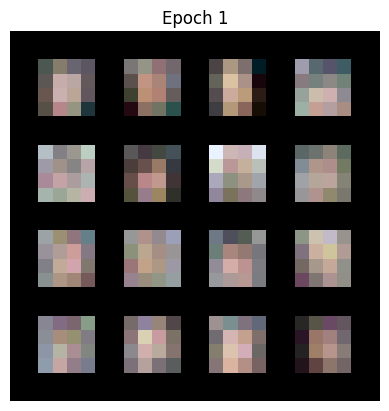

=> Saving checkpoint
=> Saving checkpoint
Current image size: 8
Epoch [1/1]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 938/938 [01:03<00:00, 14.67it/s, gp=0.00847, loss_critic=-0.362]


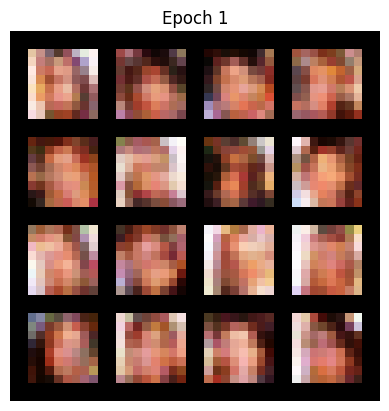

=> Saving checkpoint
=> Saving checkpoint
Current image size: 16
Epoch [1/1]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 938/938 [02:22<00:00,  6.59it/s, gp=0.018, loss_critic=-1.52]


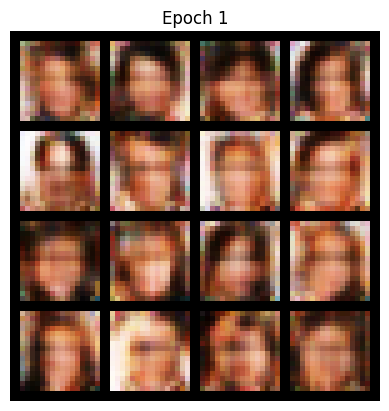

=> Saving checkpoint
=> Saving checkpoint
Current image size: 32
Epoch [1/1]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 938/938 [08:34<00:00,  1.82it/s, gp=0.0131, loss_critic=-4.07]


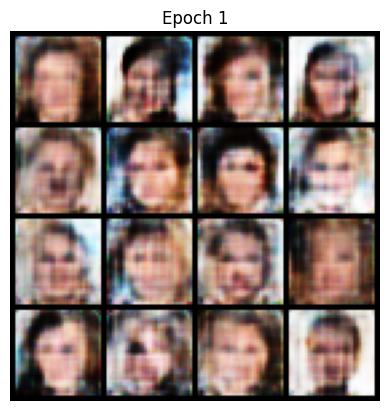

=> Saving checkpoint
=> Saving checkpoint
Current image size: 64
Epoch [1/1]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 938/938 [19:41<00:00,  1.26s/it, gp=0.0649, loss_critic=-3.28]


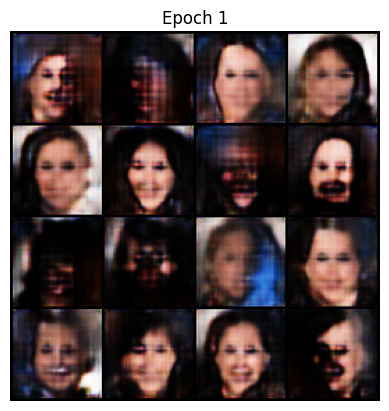

=> Saving checkpoint
=> Saving checkpoint
Current image size: 128
Epoch [1/1]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 938/938 [33:09<00:00,  2.12s/it, gp=0.0964, loss_critic=-9.98]


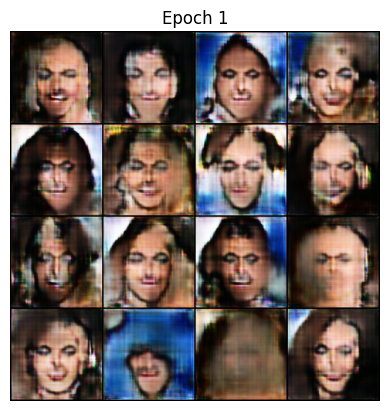

=> Saving checkpoint
=> Saving checkpoint
Current image size: 256
Epoch [1/1]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 938/938 [55:55<00:00,  3.58s/it, gp=0.0909, loss_critic=-8.07]


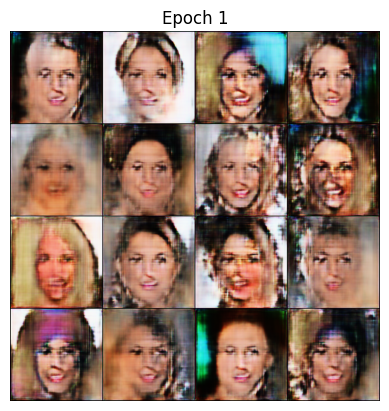

=> Saving checkpoint
=> Saving checkpoint
Current image size: 512
Epoch [1/1]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1875/1875 [1:37:43<00:00,  3.13s/it, gp=0.018, loss_critic=-6.31]


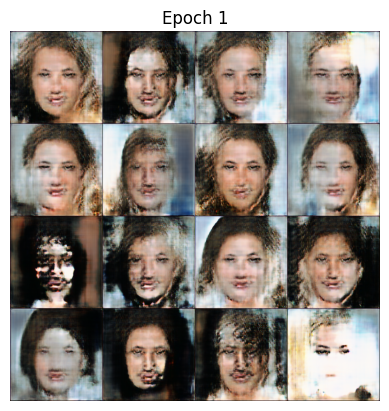

=> Saving checkpoint
=> Saving checkpoint


In [25]:
gen = Generator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)
critic = Discriminator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)

# initialize optimizers and scalers for FP16 training
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
opt_critic = optim.Adam(
    critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99)
)
scaler_critic = torch.amp.GradScaler('cuda')
scaler_gen = torch.amp.GradScaler('cuda')

# for tensorboard plotting
writer = SummaryWriter(f"logs/gan1")

if LOAD_MODEL:
    load_checkpoint(
        CHECKPOINT_GEN, gen, opt_gen, LEARNING_RATE,
    )
    load_checkpoint(
        CHECKPOINT_CRITIC, critic, opt_critic, LEARNING_RATE,
    )

gen.train()
critic.train()

tensorboard_step = 0
# start at step that corresponds to img size that we set in config
step = int(log2(START_TRAIN_AT_IMG_SIZE / 4))
for num_epochs in PROGRESSIVE_EPOCHS[step:]:
    alpha = 1e-5  # start with very low alpha
    loader, dataset = get_loader(4 * 2 ** step)  # 4->0, 8->1, 16->2, 32->3, 64 -> 4, 128->5, 256->6, 512->7, 1024->8
    print(f"Current image size: {4 * 2 ** step}")

    for epoch in range(num_epochs):
        print(f"Epoch [{epoch+1}/{num_epochs}]")
        tensorboard_step, alpha, = train_fn(
            critic,
            gen,
            loader,
            dataset,
            step,
            alpha,
            opt_critic,
            opt_gen,
            tensorboard_step,
            writer,
            scaler_gen,
            scaler_critic,
        )
        save_generated_images(gen.cpu(), epoch+1, DEVICE, alpha, step, 16)
        gen.to(DEVICE)

        if SAVE_MODEL:
            save_checkpoint(gen, opt_gen, filename=("step-" + str(step) + "-image-size-" + str(4 * 2 ** step)+ "-epoch-" + str(epoch) + "-generator.pth"))
            save_checkpoint(critic, opt_critic, filename=("step-" + str(step) + "-image-size-" + str(4 * 2 ** step) + "-epoch-" + str(epoch) + "-critic.pth"))

    step += 1  # progress to the next img size

=> Loading checkpoint
=> Loading checkpoint


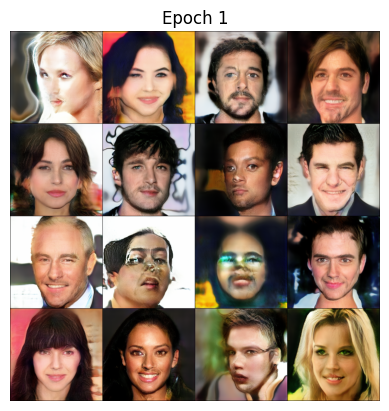

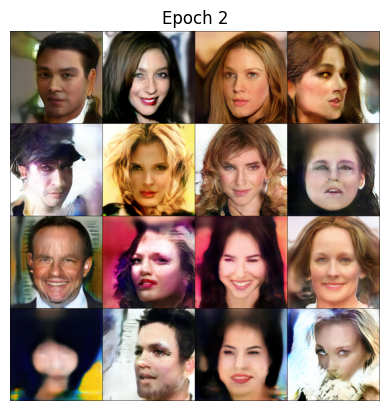

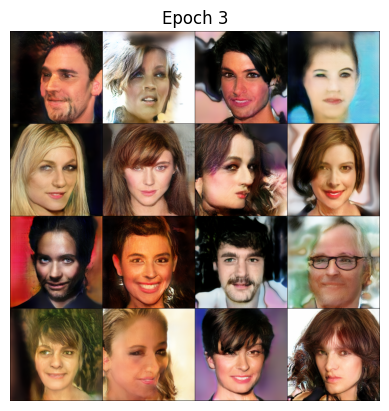

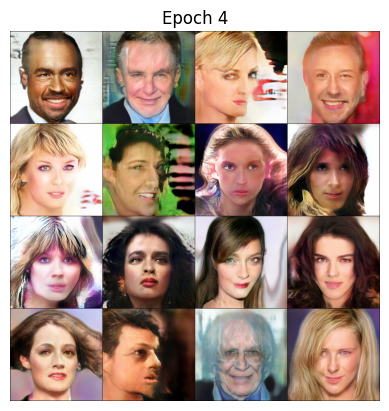

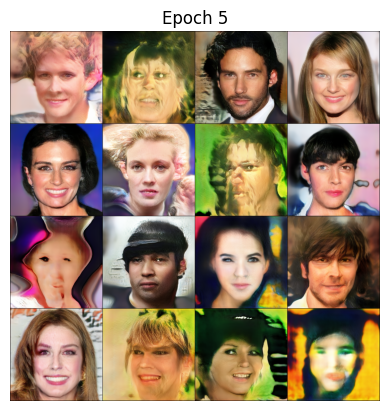

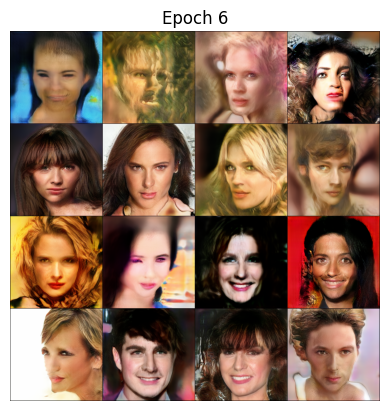

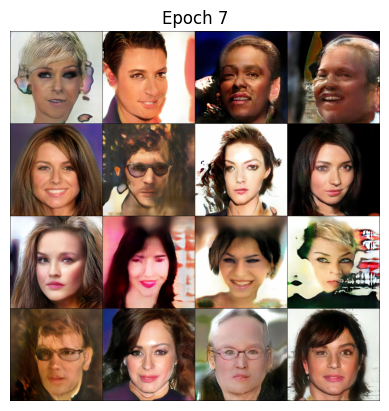

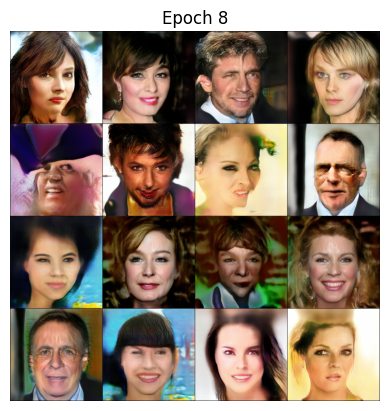

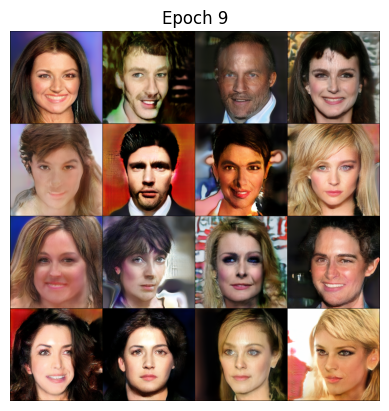

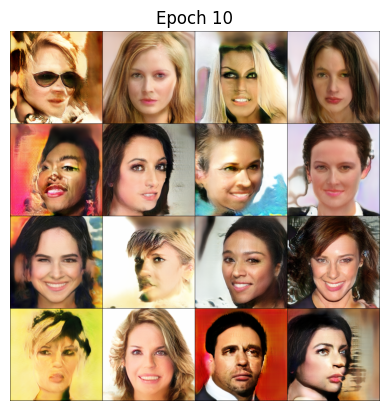

In [36]:
gen = Generator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)
critic = Discriminator(Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)

# initialize optimizers and scalers for FP16 training
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
opt_critic = optim.Adam(
    critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99)
)
scaler_critic = torch.amp.GradScaler('cuda')
scaler_gen = torch.amp.GradScaler('cuda')
load_checkpoint(CHECKPOINT_GEN, gen, opt_gen, LEARNING_RATE)
load_checkpoint(CHECKPOINT_CRITIC, critic, opt_critic, LEARNING_RATE)
gen.eval()
critic.eval()
for i in range(10):
    save_generated_images(gen.cpu(), i+1, DEVICE, alpha, 7, 16)

# Dataset at https://www.kaggle.com/datasets/lamsimon/celebahq